<a href="https://www.kaggle.com/code/venkatasubramani/land-registry-project?scriptVersionId=191460011" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/chimnie-interview-datasets/pp-complete.csv
/kaggle/input/chimnie-interview-datasets/OSGB_Grids-master/OSGB_Grids-master/README.md
/kaggle/input/chimnie-interview-datasets/OSGB_Grids-master/OSGB_Grids-master/LICENSE.txt
/kaggle/input/chimnie-interview-datasets/OSGB_Grids-master/OSGB_Grids-master/GeoJSON/OSGB_Grid_25km.geojson
/kaggle/input/chimnie-interview-datasets/OSGB_Grids-master/OSGB_Grids-master/GeoJSON/OSGB_Grid_50km.geojson
/kaggle/input/chimnie-interview-datasets/OSGB_Grids-master/OSGB_Grids-master/GeoJSON/OSGB_Grid_100km.geojson
/kaggle/input/chimnie-interview-datasets/OSGB_Grids-master/OSGB_Grids-master/GeoJSON/OSGB_Grid_20km.geojson
/kaggle/input/chimnie-interview-datasets/OSGB_Grids-master/OSGB_Grids-master/GeoJSON/OSGB_Grid_5km.geojson
/kaggle/input/chimnie-interview-datasets/OSGB_Grids-master/OSGB_Grids-master/GeoJSON/OSGB_Grid_10km.geojson
/kaggle/input/chimnie-interview-datasets/OSGB_Grids-master/OSGB_Grids-master/GeoJSON/OSGB_Grid_1km.geojson
/kaggle/inpu

In [2]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.stats import boxcox
import folium
import re
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
pd.set_option('float_format', '{:.2f}'.format)

In [3]:
print('Reading the Land Registry dataset')
col_names = ['transaction_id','price','date_of_transfer','post_code','property_type','new_build','tenure','paon','saon','street','locality','town_city','district','county','record_status','record_date_status']
use_cols = ['transaction_id','price','date_of_transfer','post_code','property_type','new_build','tenure','paon','saon','street','locality','town_city','district','county','record_date_status']
land_registry_df = pd.read_csv('/kaggle/input/chimnie-interview-datasets/pp-complete.csv',header=None, names=col_names,usecols=use_cols)
print('Land Registry dataset loaded sucessflly')
land_registry_df['date_of_transfer'] = pd.to_datetime(land_registry_df['date_of_transfer'])

Reading the Land Registry dataset
Land Registry dataset loaded sucessflly


In [4]:
#calculated area after filtering to reduce the memory consumption
# def extract_area(post_code):
#     if len(post_code) >= 2:
#         if post_code[0].isalpha() and post_code[1].isalpha():
#             return post_code[:2]
#         elif post_code[0].isalpha() and post_code[1].isdigit():
#             return post_code[0]
#     return ''

# # Apply the function to the post_code column
# land_registry_df['area'] = land_registry_df['post_code'].apply(extract_area)


In [5]:
land_registry_df.head(3)

,transaction_id,price,date_of_transfer,post_code,property_type,new_build,tenure,paon,saon,street,locality,town_city,district,county,record_date_status
0,{109BBF80-1E51-4910-8E2C-B124E1117A7A},34950,1995-06-09,BA3 3AH,F,N,L,COOMBEND HOUSE,7,COOMBEND,RADSTOCK,RADSTOCK,WANSDYKE,AVON,A
1,{D5233D67-2975-426B-B98D-B124E39331D9},133000,1995-06-19,SW18 5AG,T,N,F,142,NaN,ASTONVILLE STREET,LONDON,LONDON,WANDSWORTH,GREATER LONDON,A
2,{718BD35C-25E1-431C-8AF7-B124E63ED4E1},83000,1995-08-21,IP11 7PU,D,N,F,3,NaN,GARFIELD ROAD,FELIXSTOWE,FELIXSTOWE,SUFFOLK COASTAL,SUFFOLK,A


In [6]:
#land_registry_df.describe(include='all')

# 1. Find two land registry records that are likely to be errors

In [7]:
land_registry_df.isna().sum()

transaction_id               0
price                        0
date_of_transfer             0
post_code                47285
property_type                0
new_build                    0
tenure                       0
paon                      4185
saon                  25748964
street                  464236
locality              10664889
town_city                    0
district                     0
county                       0
record_date_status           0
dtype: int64

# Case 1: if the post_code is null

In [8]:
nan_postcode_df = land_registry_df[land_registry_df['post_code'].isna()]
nan_postcode_df.head(2)

,transaction_id,price,date_of_transfer,post_code,property_type,new_build,tenure,paon,saon,street,locality,town_city,district,county,record_date_status
2124,{14676B60-AE9D-49E5-9992-7B161D6E9A2E},10000,1995-02-13,NaN,T,N,F,13,NaN,MAIN STREET,CRUMLIN,NEWPORT,ISLWYN,GWENT,A
3783,{8E9EC4A0-D0DD-4707-8FD8-87474D269417},60000,1995-10-16,NaN,D,N,F,3,NaN,PILGRIMS LANE,CHILHAM,CANTERBURY,ASHFORD,KENT,A


In [9]:
print('dropping the row that is having null postcode')
land_registry_df = land_registry_df.dropna(subset=['post_code'])
print('null postcode records have been deleted successfully')
land_registry_df.isna().sum()

dropping the row that is having null postcode
null postcode records have been deleted successfully


transaction_id               0
price                        0
date_of_transfer             0
post_code                    0
property_type                0
new_build                    0
tenure                       0
paon                      4184
saon                  25718307
street                  455797
locality              10643700
town_city                    0
district                     0
county                       0
record_date_status           0
dtype: int64

# Case 2: if the post_code is UNknown

In [10]:

# Filter records that are not valid postcodes
invalid_postcodes_df = land_registry_df[land_registry_df['post_code']=='UNKNOWN']
invalid_postcodes_df.head(2)

,transaction_id,price,date_of_transfer,post_code,property_type,new_build,tenure,paon,saon,street,locality,town_city,district,county,record_date_status
16138100,{1F9EC230-5184-41D6-A217-5D9D7F8E95E6},160000,2009-05-08,UNKNOWN,S,Y,F,45,NaN,HESKETH WAY,BROMBOROUGH,WIRRAL,WIRRAL,MERSEYSIDE,A


In [11]:

print('dropping the row that is having postcode as unknown')
#land_resistry_df = land_registry_df.query('post_code !="UNKNOWN"')
print('dropped successfully')

dropping the row that is having postcode as unknown
dropped successfully


# 2. Complete the following table by calculating the number of sales and average sale price for all London Boroughs in 2023:

**London Borough   | Count of sales in 2023 | Average sale price in 2023**

Barking and Dagenham      | ?                |          ?

Barnet              |?             |             ?

...

In [12]:
london_borough_list = [ "Barking and Dagenham", "Barnet", "Bexley", "Brent",
                       "Bromley", "Camden", "Croydon", "Ealing", "Enfield",
                       "Greenwich", "Hackney", "Hammersmith and Fulham", 
                       "Haringey", "Harrow", "Havering", "Hillingdon", 
                       "Hounslow", "Islington", "Kensington and Chelsea",
                       "Kingston upon Thames", "Lambeth", "Lewisham", 
                       "Merton", "Newham", "Redbridge", "Richmond upon Thames",
                       "Southwark","Sutton", "Tower Hamlets", "Waltham Forest",
                       "Wandsworth","CITY OF WESTMINSTER" ]
london_borough_list =[x.upper() for x in london_borough_list]
land_registry_2023_df = land_registry_df[land_registry_df.date_of_transfer.dt.year == 2023]
land_registry_2023_london_borough_df = land_registry_2023_df[land_registry_2023_df['district'].isin(london_borough_list)]
borough_sales = land_registry_2023_london_borough_df.groupby('district')['price'].agg(['count', 'mean']).reset_index()
borough_sales.columns = ['London Borough', 'Count of Sales in 2023', 'Average Sale Price in 2023']
print('London Boroughs in 2023:')
borough_sales

London Boroughs in 2023:


,London Borough,Count of Sales in 2023,Average Sale Price in 2023
0,BARKING AND DAGENHAM,1354,396289.65
1,BARNET,3217,806740.26
2,BEXLEY,2538,433033.16
3,BRENT,1858,660906.43
4,BROMLEY,3736,603603.69
5,CAMDEN,1917,1491553.60
6,CITY OF WESTMINSTER,2637,2366354.33
7,CROYDON,3708,481507.28
8,EALING,2800,733415.07
9,ENFIELD,2423,601226.44


#  3. Count the number of new build Flats sold in each UK region since the start of 2020

In [13]:
postcode_to_region = {
    'BA': 'South West', 'BS': 'South West', 'TA': 'South West', 
    'DT': 'South West','EX': 'South West', 'PL': 'South West', 
    'TQ': 'South West', 'TR': 'South West', 'CB': 'East of England', 
    'CM': 'East of England', 'CO': 'East of England','IP': 'East of England', 
    'NR': 'East of England', 'PE': 'East of England', 'AL': 'East of England',
    'SG': 'East of England', 'LU': 'East of England', 'EN': 'East of England',
    'SS': 'East of England', 'RM': 'East of England', 
    'DN': 'Yorkshire & the Humber', 'HD': 'Yorkshire & the Humber', 
    'HG': 'Yorkshire & the Humber', 'HU': 'Yorkshire & the Humber', 
    'LS': 'Yorkshire & the Humber', 'YO': 'Yorkshire & the Humber',
    'BD': 'Yorkshire & the Humber', 'WF': 'Yorkshire & the Humber', 
    'YO': 'Yorkshire & the Humber', 'NE': 'North East & Cumbria', 
    'SR': 'North East & Cumbria', 'TS': 'North East & Cumbria', 
    'DH': 'North East & Cumbria', 'DL': 'North East & Cumbria', 
    'CA': 'North East & Cumbria', 'LA': 'North West', 'BB': 'North West', 
    'FY': 'North West', 'PR': 'North West', 'BL': 'North West', 
    'OL': 'North West', 'SK': 'North West', 'WA': 'North West', 
    'WN': 'North West', 'CH': 'North West', 'CW': 'North West', 
    'L': 'North West', 'M': 'North West', 'ST': 'North West', 
    'SY': 'North West', 'LL': 'North West', 'WA': 'North West', 'W': 'London', 
    'EC': 'London', 'WC': 'London', 'N': 'London', 'NW': 'London', 
    'E': 'London', 'SE': 'London', 'SW': 'London', 'TW': 'London',
    'SL': 'London', 'BR': 'London', 'CR': 'London', 'DA': 'London', 
    'EN': 'London', 'HA': 'London', 'IG': 'London', 'KT': 'London', 
    'RM': 'London', 'SM': 'London', 'TN': 'London', 'UB': 'London', 
    'WD': 'London', 'GU': 'London', 'RH': 'London', 'SS': 'London', 
    'Cymru': 'Wales', 'LD': 'Cymru', 'SY': 'Cymru', 'CF': 'Cymru', 
    'NP': 'Cymru', 'SA': 'Cymru', 'DG': 'Scotland', 'EH': 'Scotland', 
    'G': 'Scotland', 'KA': 'Scotland', 'ML': 'Scotland', 'PA': 'Scotland', 
    'TD': 'Scotland', 'FK': 'Scotland', 'KY': 'Scotland', 'PH': 
    'Scotland', 'IV': 'Scotland', 'AB': 'Scotland', 'DD': 'Scotland',
    'KW': 'Scotland', 'ZE': 'Scotland', 'HS': 'Scotland', 
    'BT': 'Northern Ireland','BA': 'South West', 'BH': 'South West', 
    'DT': 'South West', 'EX': 'South West', 'GL': 'South West',
    'PL': 'South West','SN': 'South West',
    'TA': 'South West', 'TQ': 'South West', 'TR': 'South West',
    'BN': 'South East', 'BR': 'South East', 'CT': 'South East', 
    'GU': 'South East', 'HP': 'South East', 'KT': 'South East', 
    'ME': 'South East', 'MK': 'South East', 'OX': 'South East', 
    'PO': 'South East', 'RG': 'South East', 'RH': 'South East', 
    'SL': 'South East', 'SM': 'South East', 'SO': 'South East',
    'SP': 'South East',
    'TN': 'South East', 'TW': 'South East', 'AB': 'Scotland', 'DD': 'Scotland',
    'DG': 'Scotland', 'EH': 'Scotland', 'FK': 'Scotland', 'G': 'Scotland', 
    'HS': 'Scotland', 'IV': 'Scotland', 'KA': 'Scotland', 'KW': 'Scotland',
    'KY': 'Scotland', 'ML': 'Scotland', 'PA': 'Scotland', 'PH': 'Scotland', 
    'TD': 'Scotland', 'ZE': 'Scotland', 'B': 'West Midlands', 
    'CV': 'West Midlands', 'DY': 'West Midlands', 'HR': 'West Midlands', 
    'ST': 'West Midlands', 
    'TF': 'West Midlands', 'WR': 'West Midlands', 'WS': 'West Midlands', 
    'WV': 'West Midlands', 'DE': 'East Midlands', 'LE': 'East Midlands',
    'LN': 'East Midlands', 'NG': 'East Midlands', 'NN': 'East Midlands', 
    'PE': 'East Midlands', 'S': 'East Midlands', 
    'DN': 'Yorkshire & the Humber', 'HD': 'Yorkshire & the Humber', 
    'HG': 'Yorkshire & the Humber', 'HU': 'Yorkshire & the Humber', 
    'HX': 'Yorkshire & the Humber', 'LS': 'Yorkshire & the Humber',
    'YO': 'Yorkshire & the Humber', 'BD': 'Yorkshire & the Humber', 
    'WF': 'Yorkshire & the Humber'
    # Add other mappings as needed
}

# Function to map postcode to region
def map_postcode_to_region(postcode):
    if isinstance(postcode, str):
        # Take the first two characters of the postcode
        postcode_area = postcode[:2]  
        if postcode_area[1].isdigit()==True:
            postcode_area = postcode[0]
        return postcode_to_region.get(postcode_area, 'Unknown')
    return 'Unknown'

land_registry_df['region'] = land_registry_df['post_code'].apply(map_postcode_to_region)

new_build_flats = land_registry_df[(land_registry_df['property_type'] == 'F') & 
                                   (land_registry_df['new_build'] == 'Y') & 
                                   (land_registry_df['date_of_transfer'] >= '2020-01-01')]
region_new_builds = new_build_flats.groupby('region').size().reset_index(name='Count of New Build Flats')
region_new_builds.columns=['Region','Count of New Build Flats from 2020']
print('The number of new build Flats sold in each UK region since the start of 2020:')
region_new_builds

The number of new build Flats sold in each UK region since the start of 2020:


,Region,Count of New Build Flats from 2020
0,Cymru,1224
1,East Midlands,4454
2,East of England,6319
3,London,42190
4,North East & Cumbria,1090
5,North West,12952
6,Scotland,4
7,South East,19366
8,South West,6722
9,West Midlands,6841


In [14]:
len(new_build_flats)

104239

In [15]:
land_registry_df[land_registry_df['region']=='Unknown']['post_code'].unique()

array(['UNKNOWN', 'LR24 8RN'], dtype=object)

# 4. Plot the number of sales per week since the start of 2020 as a line chart
Discuss the chart, and provide potential explanations for any patterns or anomalies

(Timestamp('2020-01-01 00:00:00'), Timestamp('2024-05-31 00:00:00'))
4010772


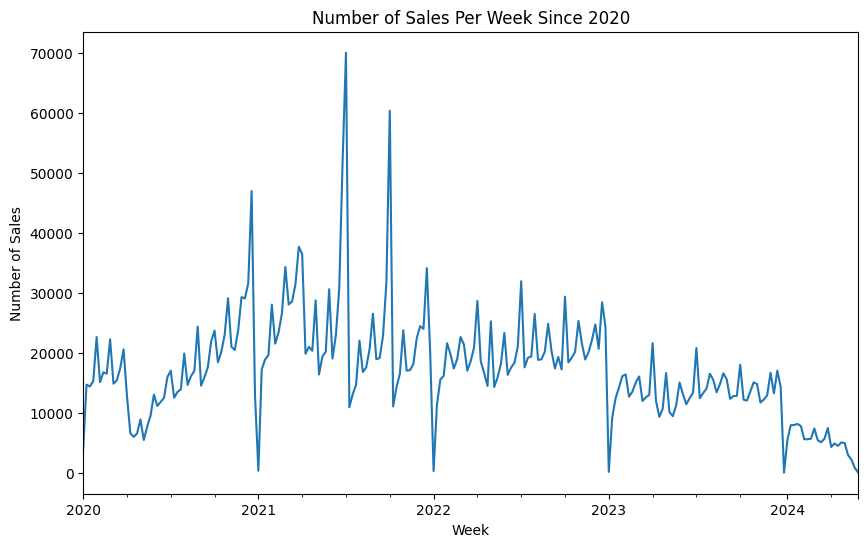

In [16]:
# Filter data from 2020 onwards
sales_since_2020 = land_registry_df[land_registry_df['date_of_transfer'] >= '2020-01-01']

print((sales_since_2020.date_of_transfer.min(),sales_since_2020.date_of_transfer.max()))
# Group by week
weekly_sales = sales_since_2020.resample('W', on='date_of_transfer').size()
print(len(sales_since_2020))
# Plot
plt.figure(figsize=(10, 6))
weekly_sales.plot()
plt.title('Number of Sales Per Week Since 2020')
plt.xlabel('Week')
plt.ylabel('Number of Sales')
plt.show()


The line chart displays the number of property sales per week in the UK from 2020 to 2024. Notable patterns include significant peaks around mid-2020 and late 2021, potentially due to pent-up demand post-pandemic lockdowns and government incentives such as the stamp duty holiday. The general trend shows fluctuations, with higher activity in the middle of the period, followed by a gradual decline towards 2024. Anomalies may reflect economic uncertainties, seasonal variations, or market adjustments following policy changes.

# 5. Plot a histogram of sale prices and discuss which distribution best represents the data
Feel free to transform the data before plotting, but explain your reasoning if you choose to do so

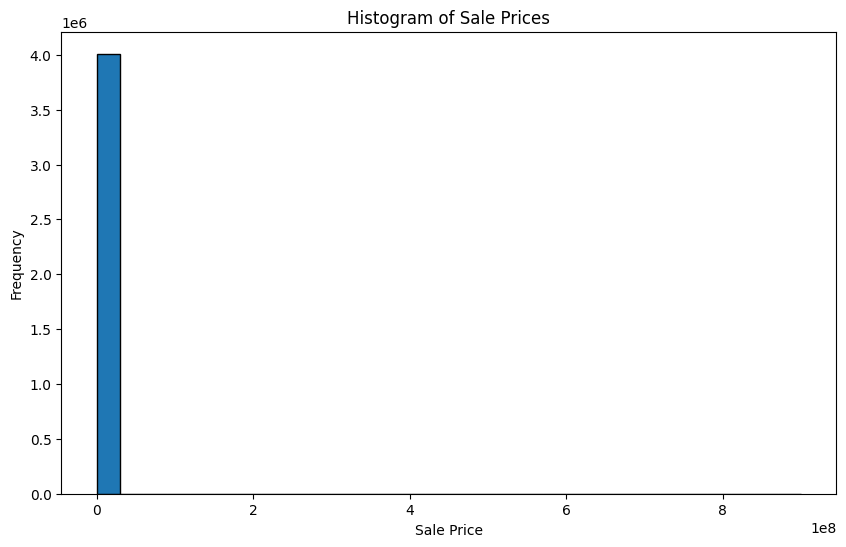

In [17]:
plt.figure(figsize=(10, 6))
plt.hist(sales_since_2020['price'], bins=30, edgecolor='k')
plt.title('Histogram of Sale Prices')
plt.xlabel('Sale Price')
plt.ylabel('Frequency')
plt.show()

We cannot infer anything from this graph, so we can try to do some transformations to get some valuable insights from the graph.

/tmp/ipykernel_18/551105778.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sales_since_2020['log_sale_price'] = np.log1p(sales_since_2020['price'])
/tmp/ipykernel_18/551105778.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sales_since_2020['sqrt_sale_price'] = np.sqrt(sales_since_2020['price'])
/tmp/ipykernel_18/551105778.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the 

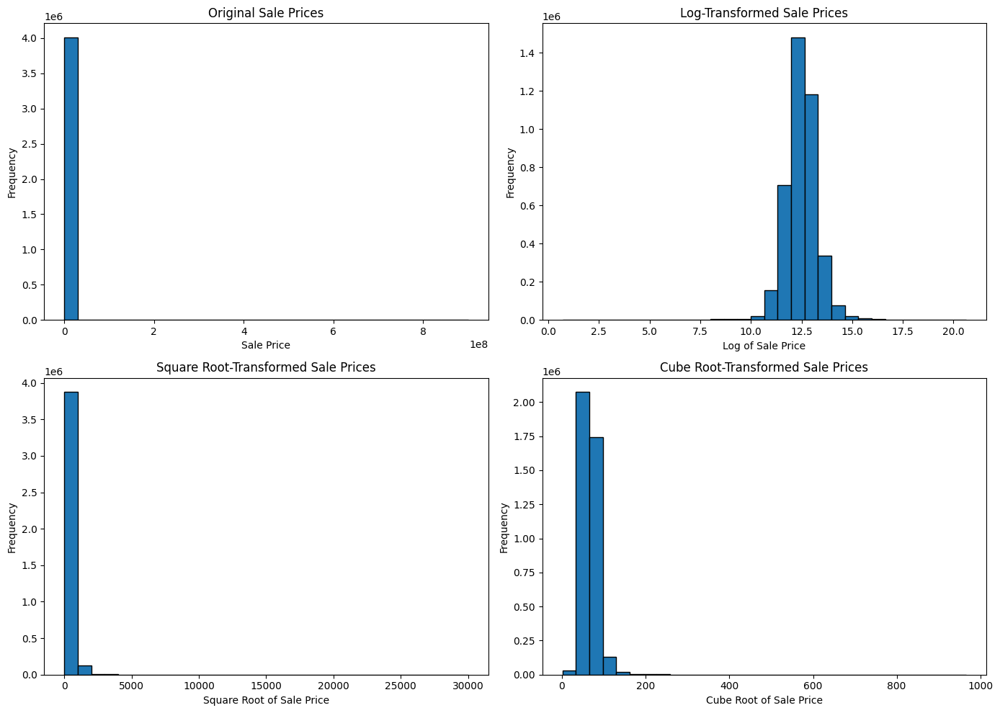

In [18]:
# Apply different transformations
sales_since_2020['log_sale_price'] = np.log1p(sales_since_2020['price'])
sales_since_2020['sqrt_sale_price'] = np.sqrt(sales_since_2020['price'])
sales_since_2020['cbrt_sale_price'] = np.cbrt(sales_since_2020['price'])

# Box-Cox transformation requires positive data
sales_since_2020['boxcox_sale_price'], _ = boxcox(sales_since_2020['price'])

# Plot histograms of the original and transformed sale prices
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Original Sale Price
axes[0, 0].hist(sales_since_2020['price'], bins=30, edgecolor='k')
axes[0, 0].set_title('Original Sale Prices')
axes[0, 0].set_xlabel('Sale Price')
axes[0, 0].set_ylabel('Frequency')

# Log-Transformed Sale Price
axes[0, 1].hist(sales_since_2020['log_sale_price'], bins=30, edgecolor='k')
axes[0, 1].set_title('Log-Transformed Sale Prices')
axes[0, 1].set_xlabel('Log of Sale Price')
axes[0, 1].set_ylabel('Frequency')

# Square Root-Transformed Sale Price
axes[1, 0].hist(sales_since_2020['sqrt_sale_price'], bins=30, edgecolor='k')
axes[1, 0].set_title('Square Root-Transformed Sale Prices')
axes[1, 0].set_xlabel('Square Root of Sale Price')
axes[1, 0].set_ylabel('Frequency')

# Cube Root-Transformed Sale Price
axes[1, 1].hist(sales_since_2020['cbrt_sale_price'], bins=30, edgecolor='k')
axes[1, 1].set_title('Cube Root-Transformed Sale Prices')
axes[1, 1].set_xlabel('Cube Root of Sale Price')
axes[1, 1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

by looking at all the different transformations we could see a better histogram with the log-transformed sale prices

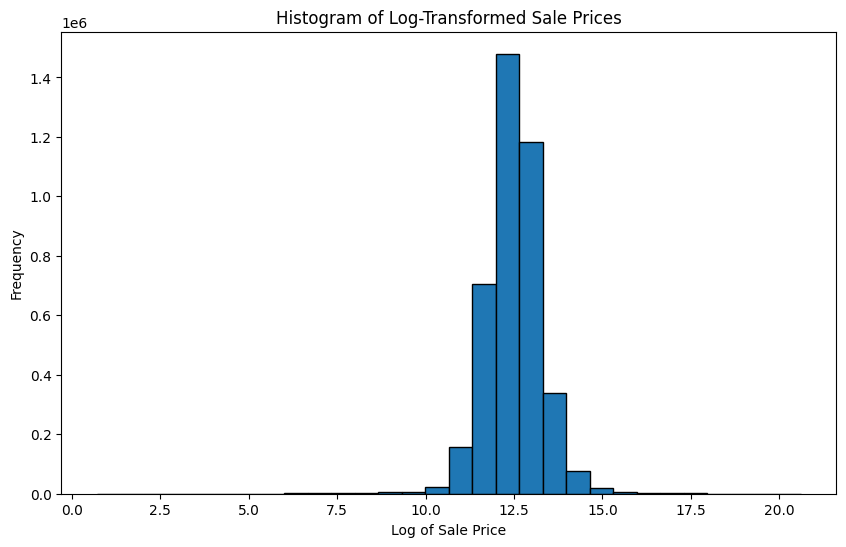

In [19]:
plt.figure(figsize=(10, 6))
plt.hist(sales_since_2020['log_sale_price'], bins=30, edgecolor='k')
plt.title('Histogram of Log-Transformed Sale Prices')
plt.xlabel('Log of Sale Price')
plt.ylabel('Frequency')
plt.show()

# For the following exercises, use the complete price paid dataset and British National grid tiles at
# 10km resolution. If you are unfamiliar with geospatial data, try using GeoPandas

In [20]:
bng_gdf = gpd.read_file('/kaggle/input/chimnie-interview-datasets/OSGB_Grids-master/OSGB_Grids-master/GeoJSON/OSGB_Grid_10km.geojson')
bng_gdf.count()

TILE_NAME    2883
25K          2883
ENGLAND      2883
SCOTLAND     2883
WALES        2883
geometry     2883
dtype: int64

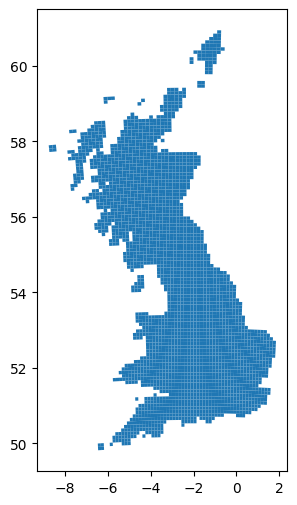

In [21]:
bng_gdf.plot(figsize=(6, 6))
plt.show()

In [22]:
req_cols = ['price','date_of_transfer','post_code','street','town_city','county','property_type','transaction_id']
# sampled_df = new_build_flats[req_cols]
sampled_df = new_build_flats[req_cols].sample(n=50000, random_state=42) # small data for fast execution
print(len(sampled_df))
sampled_df.head(3)

50000


,price,date_of_transfer,post_code,street,town_city,county,property_type,transaction_id
27281415,590000,2021-01-15,SE8 3GZ,GROVE STREET,LONDON,GREATER LONDON,F,{D22473F6-21CE-7B40-E053-6C04A8C0A630}
28266634,230000,2022-08-16,DT1 1GX,POPE STREET,DORCHESTER,DORSET,F,{F5E8B081-1839-3A13-E053-6C04A8C060B7}
26335836,955000,2021-11-26,E14 9BB,PARK DRIVE,LONDON,GREATER LONDON,F,{EC7AD099-3B4B-9200-E053-6C04A8C0E306}


I'm using the Photon geocoder to get the latitude and longitude. We cannot join the TILENAME with the postcode because they both are different. For example the Strafford area has a postcode like E15 and the corresponding 10x10km TILENAME is TQ38. After finding the laditude and longitude, I'm checking if that point lies in the geometry of the TILE.

In [23]:
from geopy.geocoders import Photon
from shapely.geometry import Point
# Initialize Photon geocoder
geocoder = Photon(user_agent="geoapiExercises")

# Function to get coordinates for an outcode using Photon
def get_coordinates(post_code):
    try:
        location = geocoder.geocode(post_code + ", UK")
        if location:
            return location.latitude, location.longitude
        return None, None
    except Exception as e:
        return None, None

sampled_df['address'] = sampled_df['street']+' '+sampled_df['town_city']+' '+sampled_df['county']+' '+sampled_df['post_code']
    # Get coordinates for each outcode
sampled_df['latitude'], sampled_df['longitude'] = zip(*sampled_df['address'].apply(get_coordinates))

k = len(sampled_df)
# Filter out rows without coordinates
sampled_df = sampled_df.dropna(subset=['latitude', 'longitude'])
print(str(k-len(sampled_df))+' records have been dropped since we are unable to find the latitude and longitude')
# Convert to GeoDataFrame with point geometries
geometry = [Point(xy) for xy in zip(sampled_df['longitude'], sampled_df['latitude'])]
sampled_df = gpd.GeoDataFrame(sampled_df, geometry=geometry)
# Ensure both GeoDataFrames use the same CRS
sampled_df = sampled_df.set_crs(bng_gdf.crs, allow_override=True)
len(sampled_df)

3005 records have been dropped since we are unable to find the latitude and longitude


46995

In [24]:
sampled_df.head(2)

,price,date_of_transfer,post_code,street,town_city,county,property_type,transaction_id,address,latitude,longitude,geometry
27281415,590000,2021-01-15,SE8 3GZ,GROVE STREET,LONDON,GREATER LONDON,F,{D22473F6-21CE-7B40-E053-6C04A8C0A630},GROVE STREET LONDON GREATER LONDON SE8 3GZ,51.43,-0.12,POINT (-0.11941 51.42517)
28266634,230000,2022-08-16,DT1 1GX,POPE STREET,DORCHESTER,DORSET,F,{F5E8B081-1839-3A13-E053-6C04A8C060B7},POPE STREET DORCHESTER DORSET DT1 1GX,50.71,-2.44,POINT (-2.43781 50.71008)


In [25]:
# Perform spatial join to find which polygons contain the points
joined_gdf = gpd.sjoin(bng_gdf, sampled_df, how='left', op='contains')

# Remove unnecessary columns and rename the geometry column
joined_gdf = joined_gdf.drop(columns='index_right')
# joined_gdf = pd.merge(bng_gdf,joined_gdf,on=['TILE_NAME','25K','ENGLAND','SCOTLAND','WALES'])
print(len(joined_gdf))
joined_gdf.head(2)


/opt/conda/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3493: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


49118


,TILE_NAME,25K,ENGLAND,SCOTLAND,WALES,geometry,price,date_of_transfer,post_code,street,town_city,county,property_type,transaction_id,address,latitude,longitude
0,HP40,t,f,t,f,"POLYGON ((-1.26961 60.68122, -1.26757 60.77100...",NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,HP50,t,f,t,f,"POLYGON ((-1.08658 60.68010, -1.08403 60.76987...",NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
len(joined_gdf)

49118

# 6. Using the BNG tiles and an appropriate scale, plot a map showing the number of sales per 10km grid square

In [27]:
sales_plot_df = joined_gdf.groupby(['geometry','TILE_NAME']).transaction_id.count().reset_index(name='number_of_sales')
sales_plot_df = gpd.GeoDataFrame(sales_plot_df,geometry='geometry')
sales_plot_df = sales_plot_df.set_crs(bng_gdf.crs, allow_override=True)
sales_plot_df.head()

,geometry,TILE_NAME,number_of_sales
0,"POLYGON ((-6.44997 49.81474, -6.45823 49.90441...",SV80,0
1,"POLYGON ((-6.45823 49.90441, -6.46654 49.99407...",SV81,0
2,"POLYGON ((-6.31938 49.90967, -6.32743 49.99935...",SV91,0
3,"POLYGON ((-6.31138 49.81999, -6.31938 49.90967...",SV90,0
4,"POLYGON ((-5.90259 49.92447, -5.90986 50.01420...",SW21,0


In [28]:
print('Number of Sales per 10km grid square')
# Create Folium map
m = folium.Map(location=[55.3781, -3.4360], zoom_start=5, tiles="CartoDB positron")

# Iterate over the rows of the GeoDataFrame
for _, r in sales_plot_df.iterrows():
    # Simplify the geometry for better performance
    sim_geo = gpd.GeoSeries(r["geometry"]).simplify(tolerance=0.001)
    geo_j = folium.GeoJson(data=sim_geo.to_json(), style_function=lambda x: {"fillColor": "orange"})
    
    # Create a popup with the 'number' value
    popup = folium.Popup(str(r["number_of_sales"]), parse_html=True)
    popup.add_to(geo_j)
    
    # Add the GeoJson object to the map
    geo_j.add_to(m)

# Display the map
m

Number of Sales per 10km grid square


# 7. Plot a map showing the average sale price per 10km grid square

In [29]:
price_plot_df = joined_gdf.groupby(['geometry','TILE_NAME']).agg({'price':'mean'}).reset_index()
price_plot_df.price = price_plot_df.price.fillna(0)
price_plot_df = gpd.GeoDataFrame(price_plot_df,geometry='geometry')
price_plot_df = price_plot_df.set_crs(bng_gdf.crs, allow_override=True)
price_plot_df.head()


,geometry,TILE_NAME,price
0,"POLYGON ((-6.44997 49.81474, -6.45823 49.90441...",SV80,0.00
1,"POLYGON ((-6.45823 49.90441, -6.46654 49.99407...",SV81,0.00
2,"POLYGON ((-6.31938 49.90967, -6.32743 49.99935...",SV91,0.00
3,"POLYGON ((-6.31138 49.81999, -6.31938 49.90967...",SV90,0.00
4,"POLYGON ((-5.90259 49.92447, -5.90986 50.01420...",SW21,0.00


In [30]:
# Create Folium map
m = folium.Map(location=[55.3781, -3.4360], zoom_start=5, tiles="CartoDB positron")
# Iterate over the rows of the GeoDataFrame
for _, r in price_plot_df.iterrows():
    # Simplify the geometry for better performance
    sim_geo = gpd.GeoSeries(r["geometry"]).simplify(tolerance=0.001)
    geo_j = folium.GeoJson(data=sim_geo.to_json(), style_function=lambda x: {"fillColor": "orange"})
    
    # Create a popup with the 'number' value
    popup = folium.Popup(str(r["price"]), parse_html=True)
    popup.add_to(geo_j)
    
    # Add the GeoJson object to the map
    geo_j.add_to(m)
    
print('average sale price per 10km grid square')
# Display the map
m

average sale price per 10km grid square


# **8. Comment on your findings**

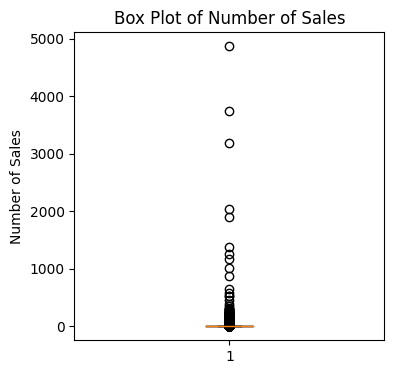

In [31]:
plt.figure(figsize=(4, 4))
plt.boxplot(sales_plot_df['number_of_sales'])
plt.title('Box Plot of Number of Sales')
plt.ylabel('Number of Sales')
plt.show()

In [32]:
min_num_sales_record = sales_plot_df.loc[sales_plot_df['number_of_sales'].idxmin()]
max_num_sales_record = sales_plot_df.loc[sales_plot_df['number_of_sales'].idxmax()]

print('----------------')
print('Number of records: '+str(len(sales_plot_df)))
print('----------------')

print('----------------')
print('min number of sales record')
print('----------------')
print(min_num_sales_record)
print('----------------')
print('max number of sales record')
print('----------------')
print(max_num_sales_record)

----------------
Number of records: 2883
----------------
----------------
min number of sales record
----------------
geometry           POLYGON ((-6.449973607183252 49.81473715575188...
TILE_NAME                                                       SV80
number_of_sales                                                    0
Name: 0, dtype: object
----------------
max number of sales record
----------------
geometry           POLYGON ((-0.128353908962011 51.50399087681167...
TILE_NAME                                                       TQ38
number_of_sales                                                 4871
Name: 2726, dtype: object


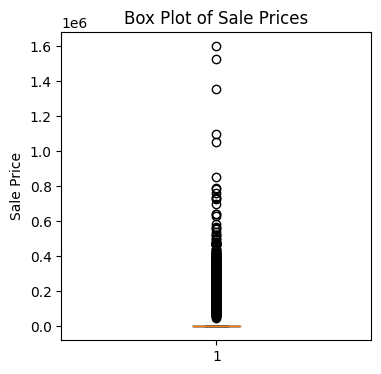

In [33]:
plt.figure(figsize=(4, 4))
plt.boxplot(price_plot_df['price'])
plt.title('Box Plot of Sale Prices')
plt.ylabel('Sale Price')
plt.show()

In [34]:
min_price_record  = price_plot_df.loc[price_plot_df['price'].idxmin()]
max_price_record  = price_plot_df.loc[price_plot_df['price'].idxmax()]
print('----------------')
print('Number of records: '+str(len(price_plot_df)))
print('----------------')
print('----------------')
print('min price record')
print('----------------')
print(min_price_record)
print('----------------')
print('max price record')
print('----------------')
print(max_price_record)

----------------
Number of records: 2883
----------------
----------------
min price record
----------------
geometry     POLYGON ((-6.449973607183252 49.81473715575188...
TILE_NAME                                                 SV80
price                                                     0.00
Name: 0, dtype: object
----------------
max price record
----------------
geometry     POLYGON ((-1.859470176258654 50.79947634955489...
TILE_NAME                                                 SU10
price                                               1600000.00
Name: 2520, dtype: object


# 9. Given everything you have learned from the exercises above, discuss the following model.In your discussion, provide an approximate R value that you would expect from the model
How would you improve the model?

What range of R^2 would you be happy with?
# Price ~ β ∗ Year + ∑ α +   ∑ γ + ε
Where: 
β is the coefficient for the year of sale
α and  γ are dummy variables corresponding to postcode area and property type respectively

In [35]:

# Create dummy variables for postcode area and property type

sampled_df = sampled_df.dropna(subset=['post_code'])
sampled_df['year']=sampled_df.date_of_transfer.dt.year

def extract_area(post_code):
    if len(post_code) >= 2:
        if post_code[0].isalpha() and post_code[1].isalpha():
            return post_code[:2]
        elif post_code[0].isalpha() and post_code[1].isdigit():
            return post_code[0]
    return ''

# Apply the function to the post_code column
sampled_df['area'] = sampled_df['post_code'].apply(extract_area)

mod_sampled_df = pd.get_dummies(sampled_df[['year','area', 'property_type','price']], columns=['area', 'property_type'], drop_first=True)
mod_sampled_df = mod_sampled_df.apply(pd.to_numeric, errors='coerce')
mod_sampled_df = mod_sampled_df.dropna()
# Define the dependent variable (price) and independent variables
X = mod_sampled_df.drop(columns=['price'])
y = mod_sampled_df['price']

# Add a constant term for the intercept
X = sm.add_constant(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and fit the linear regression model
model = LinearRegression(fit_intercept=False)  # fit_intercept=False because we already added a constant column
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
r_squared = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

# Print the R-squared value and Mean Squared Error
print(f"R-squared value: {r_squared}")
print(f"Mean Squared Error: {mse}")

def model_result(r_squared):
#     print(f"R-squared value: {r_squared}")
    if r_squared < 0:
        print("R-squared value is negative. The model is performing worse than a simple mean prediction. Consider revising the model or data.")
    elif r_squared < 0.6:
        print("The model could be improved significantly by adding more relevant predictors and interactions.")
    elif r_squared < 0.8:
        print("The model is reasonably good, but there's still room for improvement.")
    else:
        print("The model explains a substantial portion of the variance in the data.")

# Discuss the model
model_result(r_squared)


R-squared value: 0.18249851653598792
Mean Squared Error: 366316653181.4836
The model could be improved significantly by adding more relevant predictors and interactions.


**Potential improvements of the model include:**
- Adding more predictors (e.g., property size, age, local amenities).
- Considering interaction terms (e.g., year and postcode, postcode and property type).
- Using polynomial terms for non-linear effects.
- Trying regularization techniques (e.g., Lasso, Ridge regression).
- Exploring advanced machine learning models (e.g., Random Forest, Gradient Boosting).

# 10. Energy Performance Certificates (EPCs) are published for each property transaction recorded by the Land Registry. The data schema for these is available here

I. Which fields from this dataset would be useful in determining sale price?

II. How would you approach the task of joining the EPC database with the Land Registry?

N.B. We don't expect you to actually join the databases - but please provide as
much detail as possible about how you would approach the task.

I. **Fields from EPC Dataset Useful in Determining Sale Price
From the Energy Performance Certificates (EPC) dataset, the following fields could be useful in determining the sale price of a property**:

* **Current Energy Rating**: Indicates the energy efficiency of the property, which can influence buyer perception and thus affect the price.
* **Potential Energy Rating**: Shows the potential energy efficiency after improvements, which can impact the perceived value of the property.
* **Property Type**: Describes the type of property (e.g., House, Flat, Maisonette), which is crucial in determining market value.
* **Built Form**: Indicates the building type (e.g., Detached, Semi-Detached, Terrace), directly affecting the property value.
* Total Floor Area: Larger properties typically sell for higher prices.
* **Mains Gas Flag**: Availability of mains gas can influence the property's desirability and price.
* **Number of Habitable Rooms**: More rooms generally mean a higher value.
* **Number of Heated Rooms**: Indicates the extent of the property's heated space, which can influence buyer interest and price.
* **Inspection Date**: Recent inspections might reflect the current condition of the property more accurately.
* **Local Authority**: The location of the property can significantly impact its price.
* **Environmental Impact (Current and Potential)**: Measures of the property's environmental impact, which can influence buyer decisions, especially those concerned with sustainability.
* **Heating Cost (Current and Potential)**: High heating costs can be a deterrent for buyers, thus affecting the sale price.
* **Lighting Cost (Current and Potential)**: Similarly, high lighting costs can impact the perceived value.
* **CO₂ Emissions (Current and Potential)**: Lower emissions might be more attractive to environmentally conscious buyers.


II. Approach to Joining EPC Database with the Land Registry
To join the EPC database with the Land Registry data, we can follow these steps:

**1. Identify Common Fields**
* Postcode: Both datasets are likely to include postcodes, which can be used to match properties.
* Unique Property Reference Number (UPRN): If available, UPRN is a robust identifier for matching properties across datasets.

**2. Preprocess the Data**
* Standardize Postcodes: Ensure that postcodes in both datasets are in a consistent format (e.g., all uppercase, with or without spaces).
* Handle Missing Data: Identify and address any missing or null values in the key fields to prevent mismatches.

**3. Matching Strategy**
* Direct Match Using UPRN: If UPRNs are available in both datasets, perform a direct match using this unique identifier.
* Match Using Postcode and Address: If UPRN is not available, match using a combination of postcode and address fields (e.g., ADDRESS1, ADDRESS2, ADDRESS3).

**4. Data Cleaning and Transformation**
* Clean Address Fields: Remove any extraneous characters and standardize the formatting of address fields.
* Geocode if Necessary: Use a geocoding service to resolve ambiguous or incomplete addresses.

**5. Join the Datasets**
* Use SQL or a data manipulation library (e.g., Pandas in Python) to perform the join operation.
* I personally prefer SQL because it is very much faster than pandas

**6. Validate the Join**
* Sample Check: Randomly check a sample of the joined records to ensure accuracy.
* Check for Duplicates: Ensure there are no duplicate records unless they are legitimate (e.g., multiple EPCs for the same property due to re-inspections).

**7. Analyze the Merged Dataset**
* Perform exploratory data analysis (EDA) to understand the characteristics of the joined dataset.
* Use statistical methods or machine learning models to analyze the relationship between EPC attributes and sale prices.


By following this approach, we can effectively join the EPC dataset with the Land Registry data to enhance your analysis of property values based on energy performance and other factors.